# Toy spectrogram stuff

### Cyclotron radiation
The angular cyclotron frequency, $\Omega_c$, of an electron with kinetic energy $T$ and mass $m_{e}$ in a magnetic field $B$ is
$$ \Omega_{C} = \frac{eB}{\gamma m_e}=\frac{eB}{m_e + T/c^2} $$
The cyclotron frequency $f_c$ is related to the angular cyclotron frequency in the usual fashion.
$$ f_c = \frac{\Omega_c}{2 \pi} $$

# Energy loss --> Frequency change

Taking equation (2) from http://dx.doi.org/10.1103/PhysRevD.80.051301

$$ P(\beta, \theta)  = \frac{1}{4 \pi \epsilon_{0}} \frac{2 q^2 \omega_{0}^2}{3 c} \frac{\beta^2 \sin^2 \theta}{1 - \beta^2} $$



In [1]:
# Import some standard python analysis and plotting packages
import numpy as np
import scipy.constants
import matplotlib.pyplot as plt
import matplotlib
import math
matplotlib.rcParams['figure.dpi']=300 # highres display


from matplotlib import rc
rc('font',**{'family':'serif','serif':['Avenir']})


In [2]:
# Define the kinetic energy at the tritium end point
T_end=18.574*1000*scipy.constants.e  #18.574keV in J
B=1 # 1 T

In [3]:
def getCyclotronFreq(B,T):
    """Function to return the cyclotron frequency emitted by an electron with kinetic energy T 
    in a magentic field B

    Args:
        B: The magentic field in Tesla
        T: The kinetic energy in Joules
        
    Returns:
        The cylotron frequency, f_c, in Hz.

    """
    return ((scipy.constants.e*B)/(scipy.constants.m_e + T/(scipy.constants.c**2)))/(2*np.pi)


def getCyclotronFreqTime(B,T,t,pitch=math.pi/2):
    """Function to return the cyclotron frequency emitted by an electron with kinetic energy T 
    in a magentic field B and time t.... assuming a given angle???

    Args:
        B: The magentic field in Tesla
        T: The kinetic energy in Joules
        t: Time in seconds
        pitch: Pitch angle in radians
    Returns:
        The cylotron frequency, f_c, in Hz.

    """
    return ((scipy.constants.e*B)/(scipy.constants.m_e + T/(scipy.constants.c**2)))*(1+getPower(B,getBetaFromT(T),pitch)*t/(scipy.constants.m_e*scipy.constants.c**2 + T))/(2*np.pi)

def getPower(B,beta,theta):
    gamma=1./np.sqrt(1-beta**2)
    T=gamma*scipy.constants.m_e*scipy.constants.c**2 -scipy.constants.m_e
    w0=getCyclotronFreq(B,T)
    f1=1/(4*math.pi*scipy.constants.epsilon_0)
    f2=2*scipy.constants.e**2*w0**2/(3*scipy.constants.c)
    f3=beta**2 * np.sin(theta)**2 / (1 - beta**2)
    return f1*f2*f3

def getBetaFromT(T):
    gamma=(scipy.constants.m_e*scipy.constants.c**2+T)/(scipy.constants.m_e*scipy.constants.c**2)
    return np.sqrt((gamma**2-1)/gamma**2)



2.9758828799916e-15
27010694055.736893
2284368.663787842


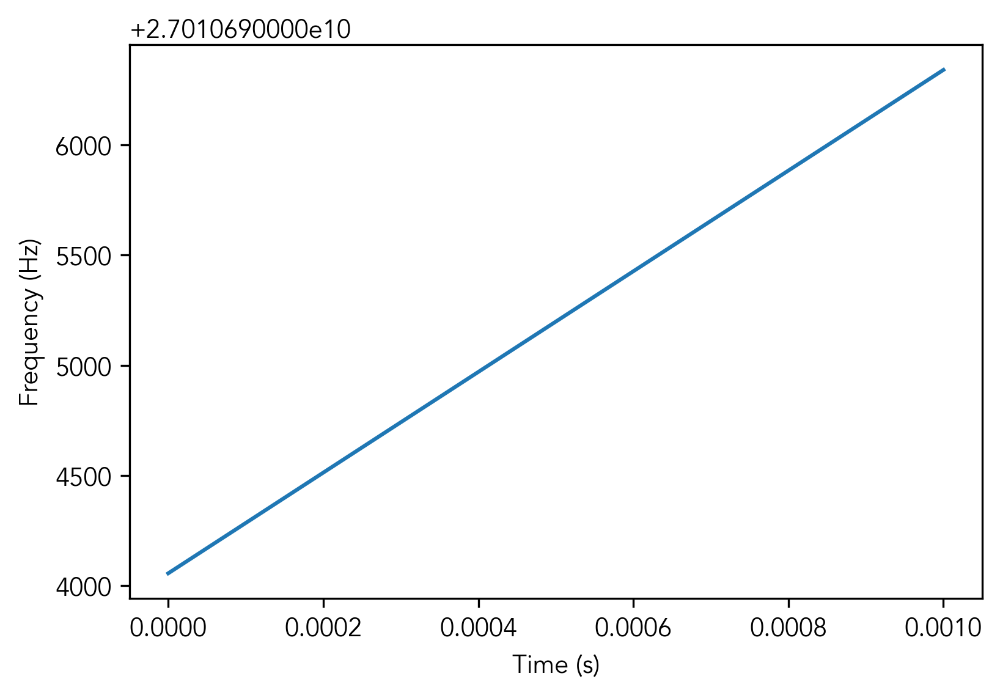

In [7]:
print(T_end)
fig,ax = plt.subplots()
tArray=np.linspace(0,1e-3,100)
fArray=getCyclotronFreqTime(1,T_end,tArray)
ax.plot(tArray,fArray)
#ax.plot(tArray,(T_end-getPower(1,getBetaFromT(T_end),math.pi/2)*tArray)/scipy.constants.e)
ax.set_xlabel("Time (s)")
ax.set_ylabel("Frequency (Hz)")

print(fArray[0])
print((fArray[-1]-fArray[0])/(tArray[-1]-tArray[0]))


Power: 7.175739074589474e-18 W


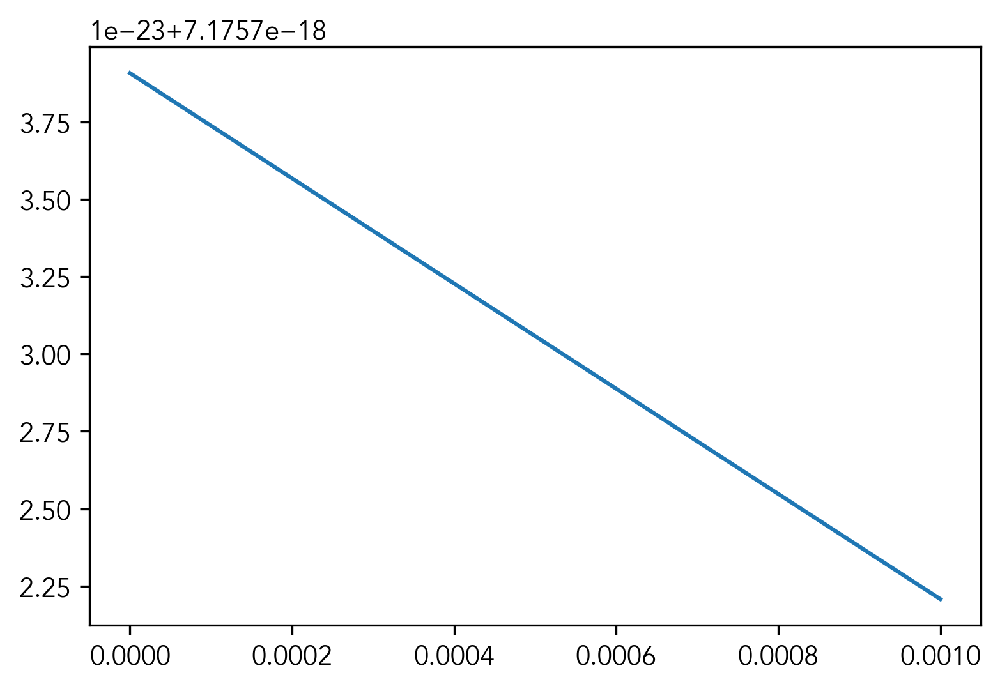

In [5]:
fig,ax = plt.subplots()
print("Power:",getPower(1,getBetaFromT(T_end),math.pi/2),"W")
P=getPower(1,getBetaFromT(T_end),math.pi/2)
ax.plot(tArray,getPower(1,getBetaFromT(T_end-getPower(1,getBetaFromT(T_end),math.pi/2)*tArray),math.pi/2))

# Antenna Noise

The total power received is
$$P_{total} = k_{B} T_{ant} \Delta B$$
where $k_B$ is the Boltzmann constant, $T_{ant}$ the effective antenna temperature and $\Delta B$ the bandwidth. 

For an antenna with a resistance of $R$ the noise voltage can be characterised as:
$$< V^2 > = 4kTR\Delta B$$

For this example we will take a bandwidth of 500MHz (for sampling at a GSa/s), a temperature of 4K and a resistance of 50$\Omega$

In [39]:
def getNoiseSigma(T,R,bw):
    """Function to return noise sigma 

    Args:
        T: The effectove antenna temperature in K
        R: The antenna resistance in Ohms
        bw: The system bandwidth in Hz
        
    Returns:
        The noise sigma in volts

    """
    return np.sqrt(4*scipy.constants.k*R*T*bw)

sigma=getNoiseSigma(4,50,500e6)
print("Noise sigma=",sigma," volts")


Noise sigma= 1.1750102127215746e-06  volts


In [7]:
T_acq=1e-3  #100micros of data
dt=1e-9 #1 G sample/s
fs=1/dt #Sampling frequency
numSamps=int(T_acq/dt) #Number of samples
noise=np.random.normal(scale=sigma,size=numSamps)  #An array of noise values


Text(0, 0.5, 'Voltage (V)')

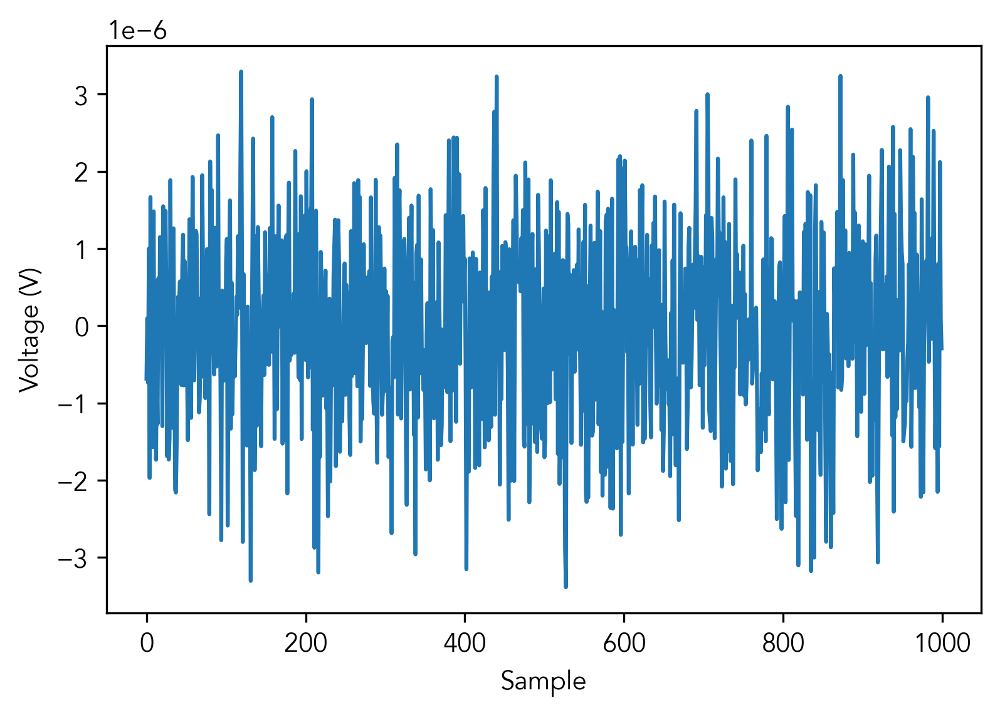

In [8]:
fig,ax = plt.subplots()
sampArray=np.arange(numSamps)
ax.plot(sampArray[:1000],noise[:1000])
ax.set_xlabel("Sample")
ax.set_ylabel("Voltage (V)")

9.0 9.0
Parseval's Check
Sum of periodgram values: 1.3829631144005055e-15
Time domain sum V^2/fs 1.3829713627896745e-15
There seems to be a factor off N


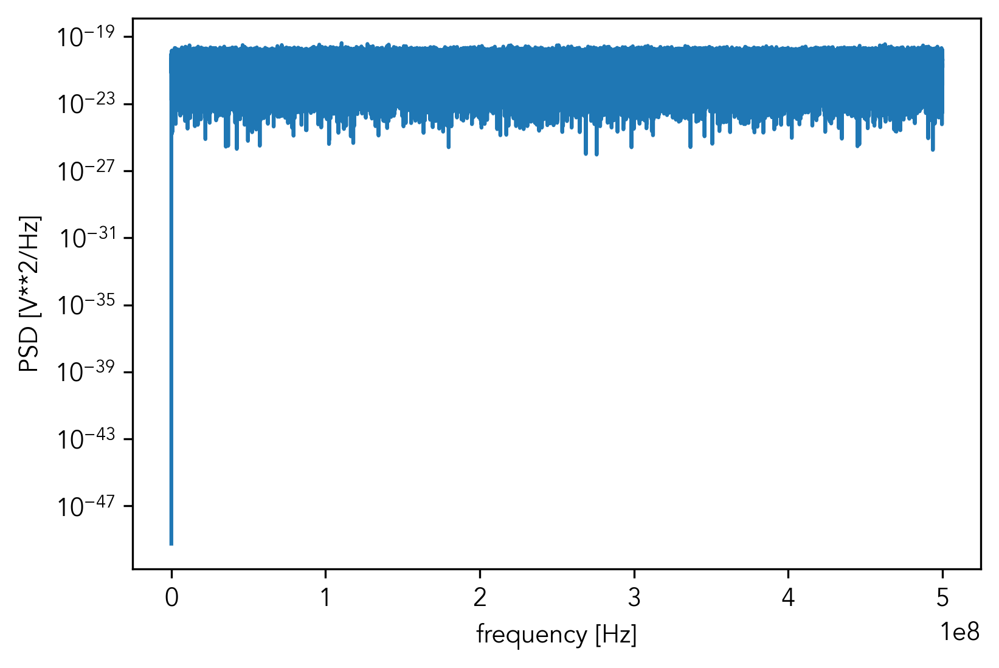

In [9]:
from scipy import signal
fig,ax = plt.subplots()
print(np.log10(fs),np.log10(1e9))
f, Pxx_den = signal.periodogram(noise, fs)
ax.semilogy(f, Pxx_den)
#ax.set_ylim([1e-24, 1e-19])
ax.set_xlabel('frequency [Hz]')
ax.set_ylabel('PSD [V**2/Hz]')

print("Parseval's Check")
print("Sum of periodgram values:",np.sum(Pxx_den))
print("Time domain sum V^2/fs",np.sum(noise**2)/fs)
print("There seems to be a factor off N")


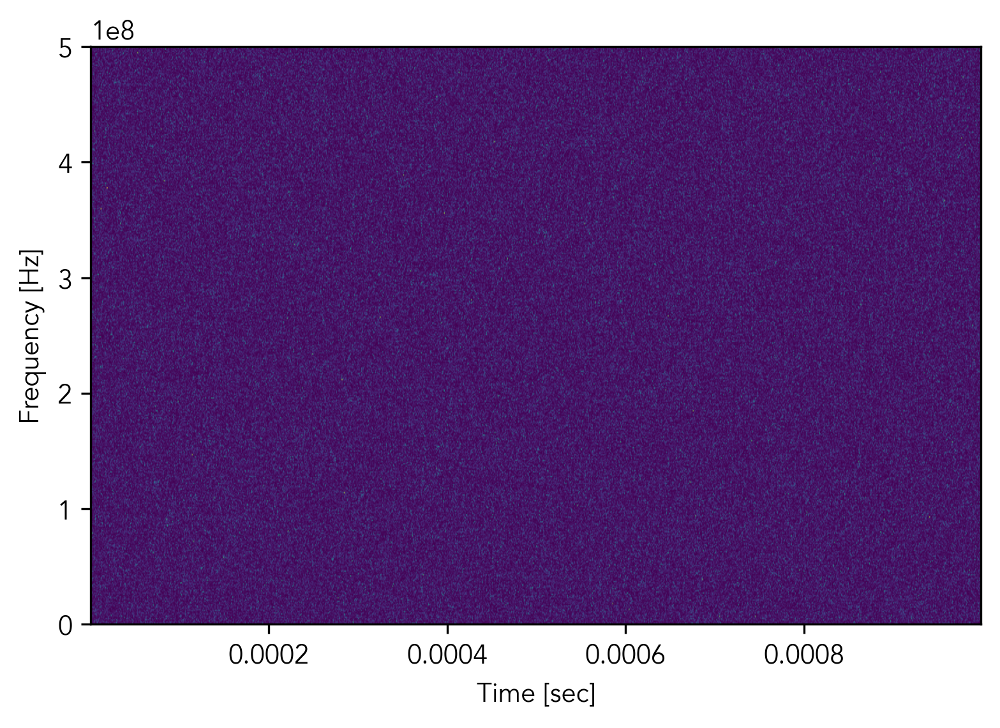

(501,) (1142,) (501, 1142)


In [10]:
f, t, Sxx = signal.spectrogram(noise, fs,scaling='spectrum',nperseg=1000)
plt.pcolormesh(t, f, Sxx, shading='gouraud')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.show()
print(f.shape,t.shape,Sxx.shape)

In [11]:
from scipy.fft import fft, ifft,rfft,irfft
f_noise = fft(noise)
rf_noise = rfft(noise)
rf_noise=rf_noise*np.sqrt(2) #Accounts for the negative frequencies
rf_noise[0]=rf_noise[0]/np.sqrt(2) #Don't need to multiply the DC component by sqrt(2)
print(noise.shape,f_noise.shape,rf_noise.shape)

(1000000,) (1000000,) (500001,)


# FFT Normalisation

Parseval's Theorem states that 
$$ \sum_{i=0}^{N-1} V_i^2 = \frac{1}{N} \sum_{j=0}^{N-1} \left| H_j\right|^2 $$
where $V_i$ is the voltage in the $i$th sample of a time series and $|H_j|$ is the magnitude of $j$th frequency bin of a frequency bin.

Now if the $V_i$ are real then a standard Fourier transform will return N frequency bins where the bins range from -$f_{Nyquist}$ to $+f_{Nyquist}$ where $f_{Nyquist}=0.5 *f_{samp}$

The rfft alogirthm in scipy only returns the positive frequency components (the negative frequency components are just the hermitian conjugates). To account for this in the above code we multiply all of the positive frequency Fourier coefficients by $\sqrt{2}$.

Noise sigma= 1.1750102127215746e-06  volts
Voltage std dev= 1.175994521416025e-06
Noise Sigma * sqrt(N) 0.0011750102127215747
Real std dev= 0.0011758301121461657
Imag std dev= 0.0011761645764533013
V^2 sum= 1.3829713627896742e-06
|H_i|^2/N sum= 1.382971362789675e-06
|H_i|^2/N sum= 1.3829732976461294e-06
sigma**2 * N= 1.380649e-06
1000000 1001396.0482567723


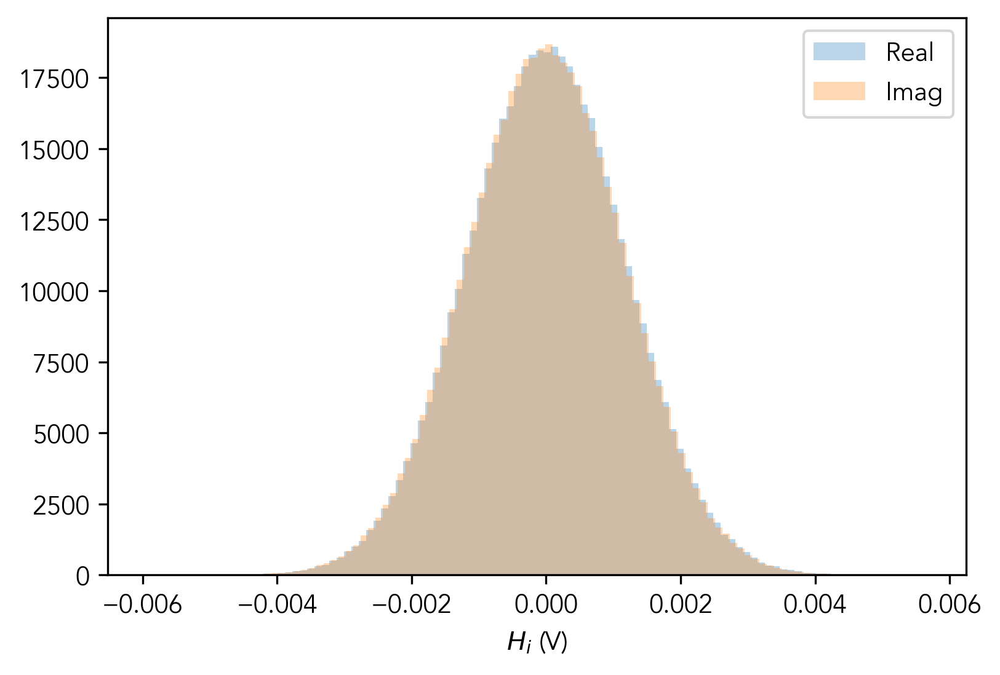

In [12]:
fig,ax = plt.subplots()
ax.hist(np.real(rf_noise),100,alpha=0.3,label="Real")
ax.hist(np.imag(rf_noise),100,alpha=0.3,label="Imag")
ax.set_xlabel("$H_i$ (V)")
ax.legend()
print("Noise sigma=",sigma," volts")
print("Voltage std dev=",np.std(noise))
print("Noise Sigma * sqrt(N)",sigma*np.sqrt(numSamps))
print("Real std dev=",np.std(np.real(rf_noise)))
print("Imag std dev=",np.std(np.imag(rf_noise)))
print("V^2 sum=",np.sum(noise**2))
print("|H_i|^2/N sum=",np.sum(np.abs(f_noise)**2)/(numSamps))
print("|H_i|^2/N sum=",np.sum(np.abs(rf_noise)**2)/(numSamps))
print("sigma**2 * N=",sigma**2*(numSamps))
print(numSamps, (np.std(np.real(rf_noise)) / sigma)**2)


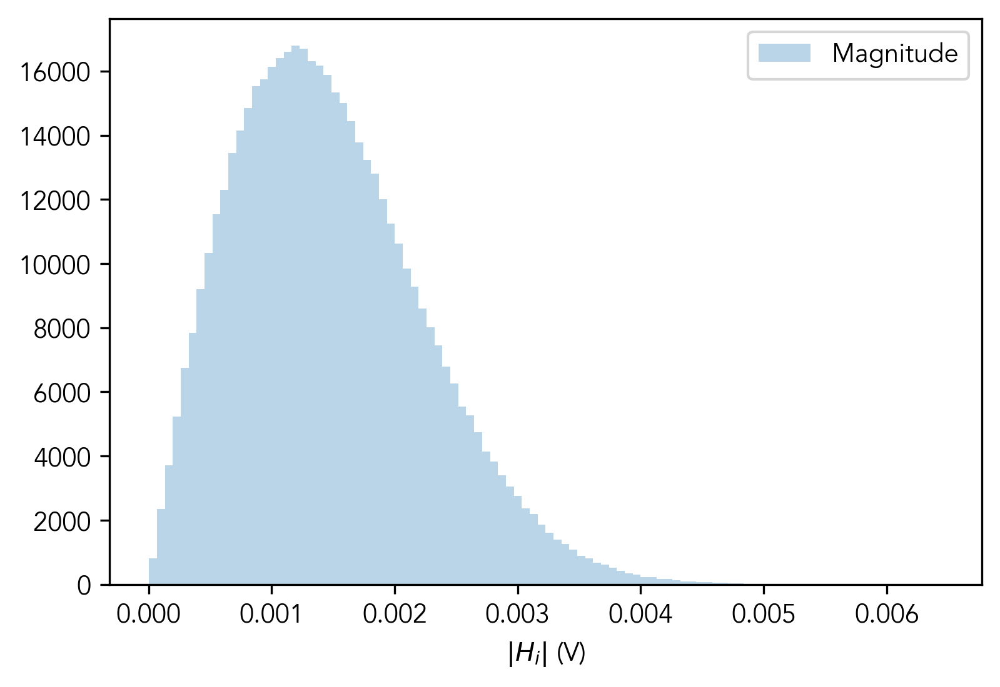

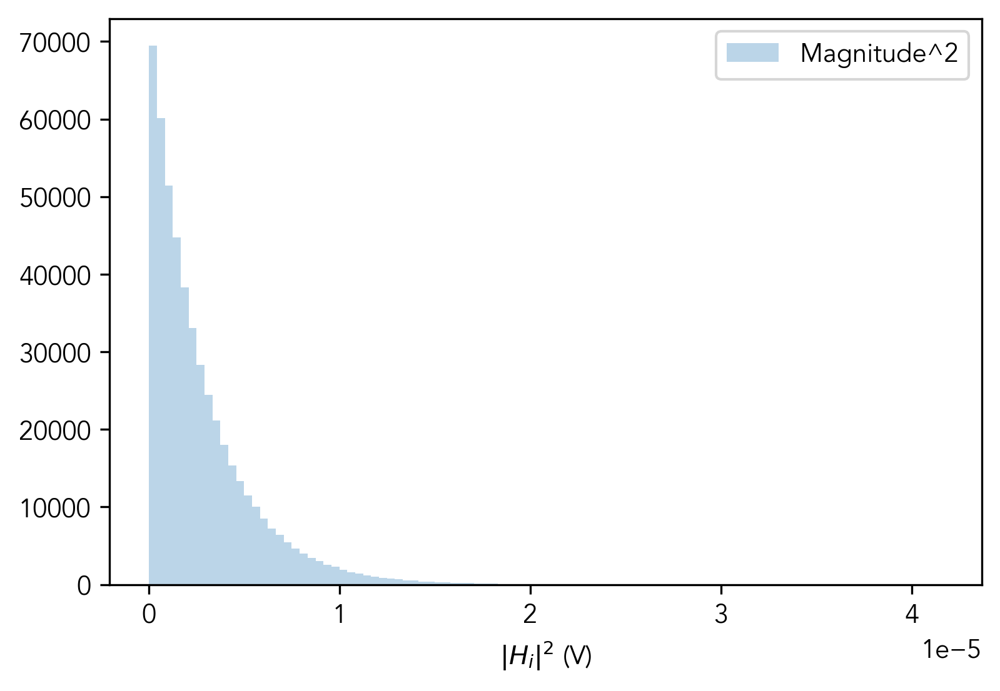

In [13]:
fig,ax = plt.subplots()
ax.hist(np.abs(rf_noise),100,alpha=0.3,label="Magnitude")
ax.set_xlabel("$|H_i|$ (V)")
ax.legend()

fig,ax = plt.subplots()
ax.hist(np.abs(rf_noise)**2,100,alpha=0.3,label="Magnitude^2")
ax.set_xlabel("$|H_i|^2$ (V)")
ax.legend()

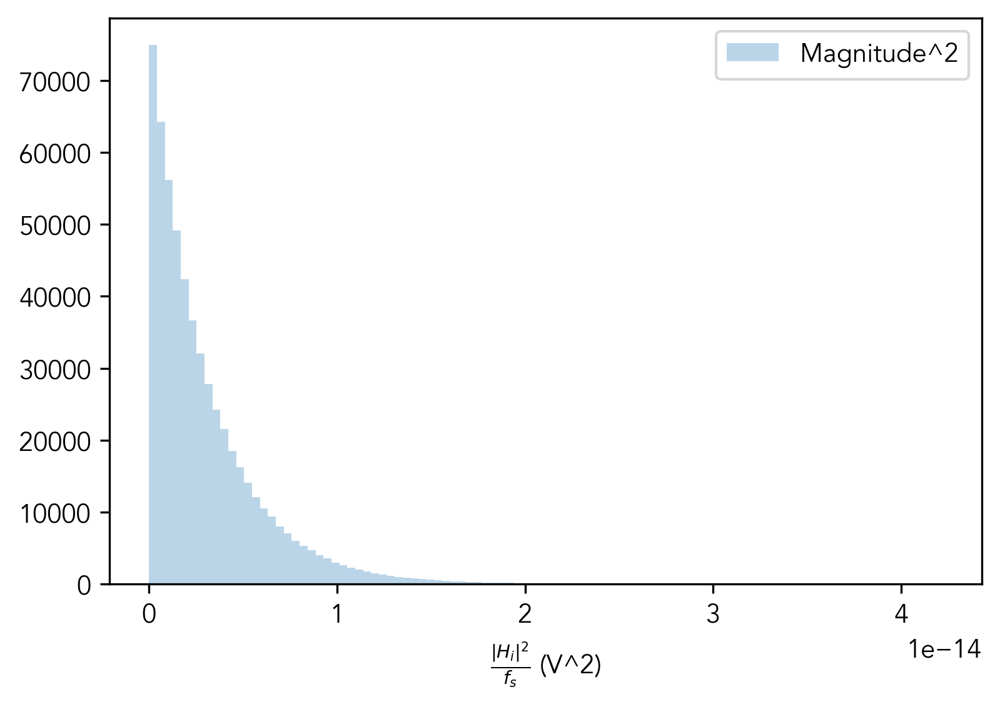

In [14]:
fig,ax = plt.subplots()
#print(Sxx.flatten().shape)
ax.hist(Sxx.flatten(),100,alpha=0.3,label="Magnitude^2")
ax.set_xlabel(r"$\frac{|H_i|^2}{f_s}$ (V^2)")
ax.legend()

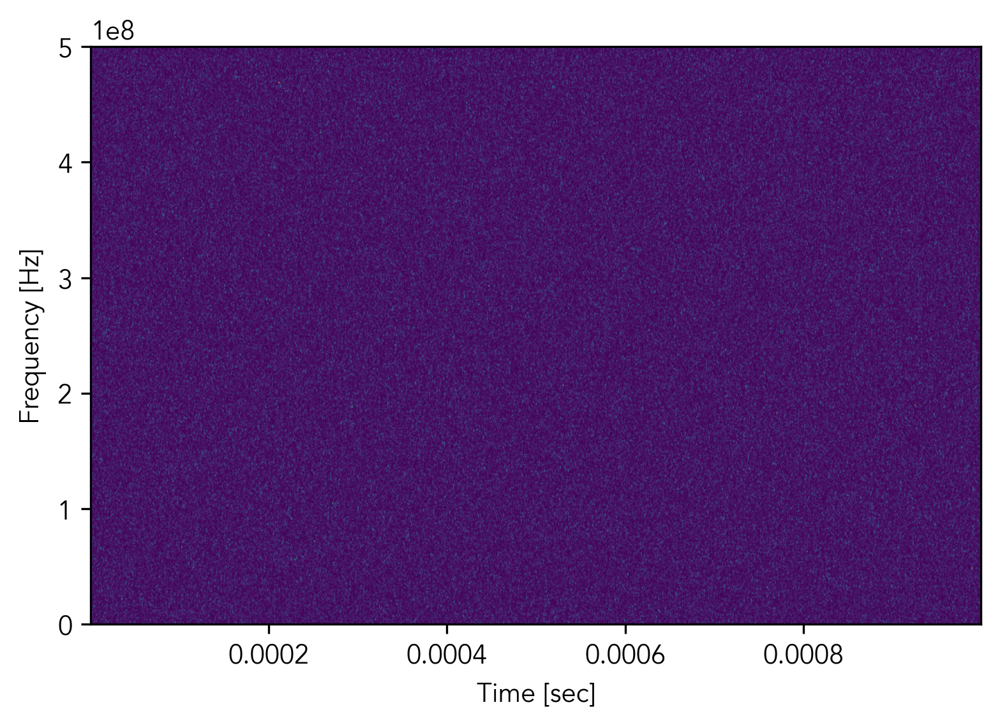

(501,) (1000,) (501, 1000)
Time domain sum V^2/fs 1.379340617075075e-15
Sum of Sxx 1.3781543455257649e-15
So there are a couple of things which are 'off' here.
Firstly, unless noverlap=0 the Sxx sum is larger than the V^2/fs value
Secondly, there is a factor of N missing so Parseval's theorem is not obeyed. This is the same as the periodogram normalisation


In [15]:
T_acq=1e-3  #100micros of data
dt=1e-9 #1 G sample/s
fs=1/dt #Sampling frequency
numSamps=int(T_acq/dt) #Number of samples
noise=np.random.normal(scale=sigma,size=numSamps)  #An array of noise values

f, t, Sxx = signal.spectrogram(noise, fs,nperseg=1000,noverlap=0)
plt.pcolormesh(t, f, Sxx, shading='gouraud')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.show()
print(f.shape,t.shape,Sxx.shape)
print("Time domain sum V^2/fs",np.sum(noise**2)/fs)
print("Sum of Sxx",np.sum(Sxx.flatten()))
print("So there are a couple of things which are 'off' here.")
print("Firstly, unless noverlap=0 the Sxx sum is larger than the V^2/fs value")
print("Secondly, there is a factor of N missing so Parseval's theorem is not obeyed. This is the same as the periodogram normalisation")

2.9758828799916e-15


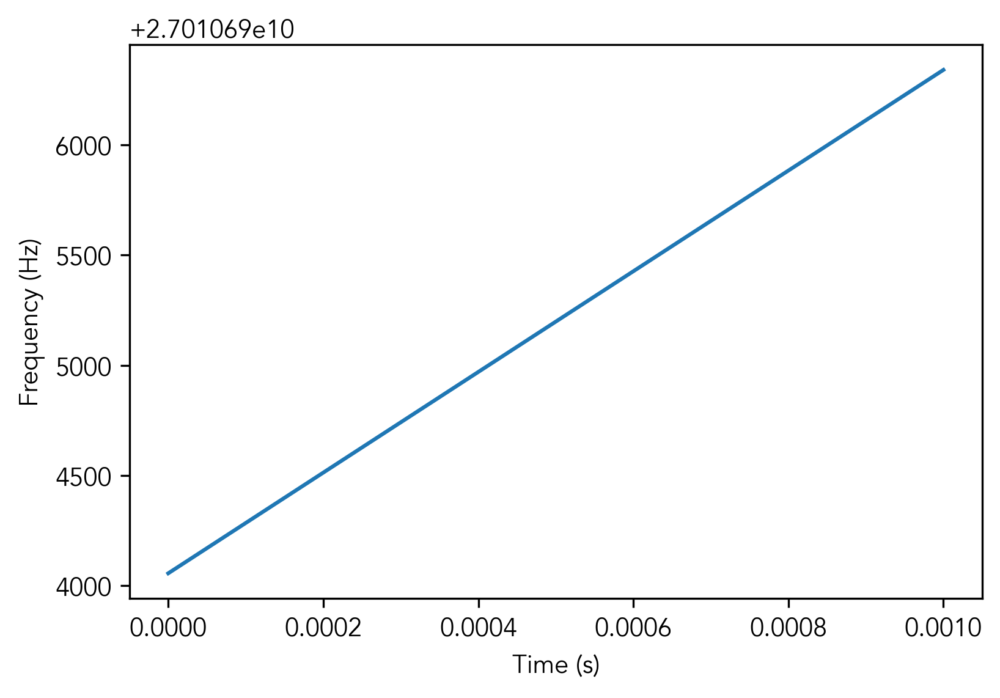

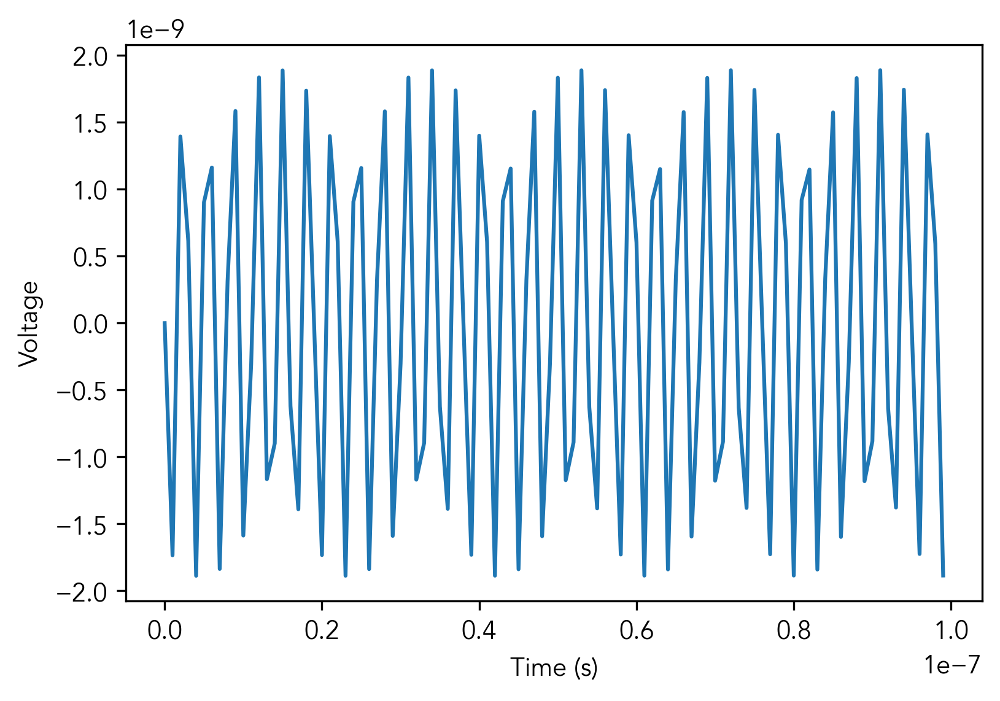

In [16]:
T_acq=1e-3
numSamps=int(T_acq/dt)
print(T_end)
fig,ax = plt.subplots()
tArray=np.linspace(0,T_acq,numSamps)
ax.plot(tArray,getCyclotronFreqTime(1,T_end,tArray))
#ax.plot(tArray,(T_end-getPower(1,getBetaFromT(T_end),math.pi/2)*tArray)/scipy.constants.e)
ax.set_xlabel("Time (s)")
ax.set_ylabel("Frequency (Hz)")



fig,ax = plt.subplots()

ft=tArray*getCyclotronFreqTime(1,T_end,tArray)
mysignal=math.sqrt(P/2)*np.sin(ft/(2*math.pi))
ax.plot(tArray[0:100],mysignal[0:100])
ax.set_xlabel("Time (s)")
ax.set_ylabel("Voltage")


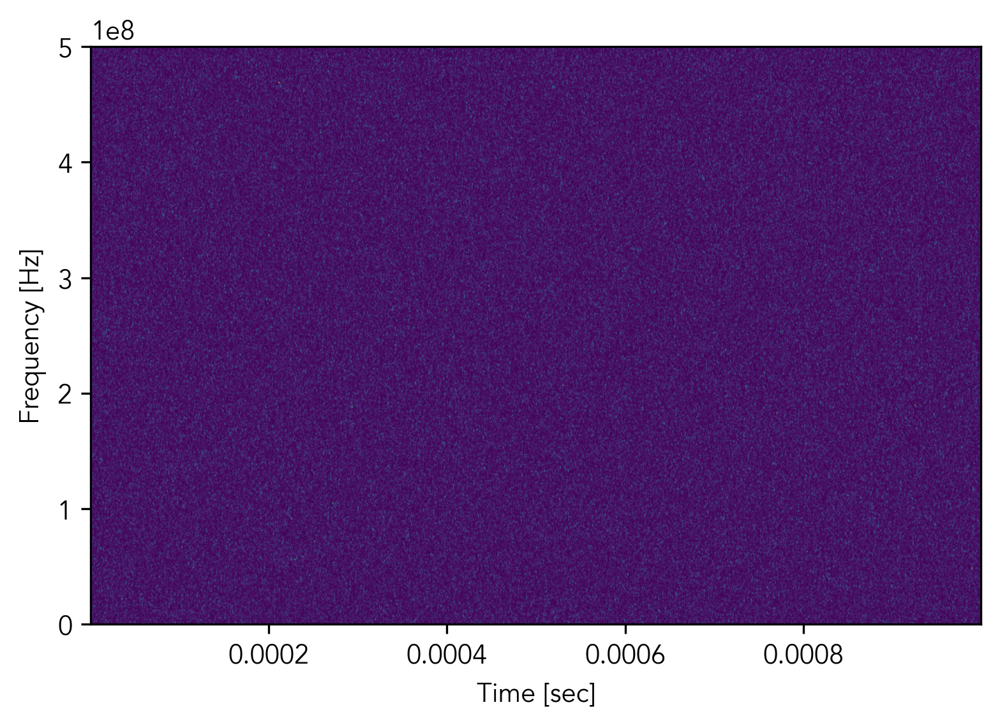

In [48]:
f, t, Sxx = signal.spectrogram(noise+mysignal, fs,nperseg=1000,noverlap=0)
plt.pcolormesh(t, f, Sxx, shading='gouraud')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.show()

Power 7.175739074589474e-18


Text(0, 0.5, 'Voltage')

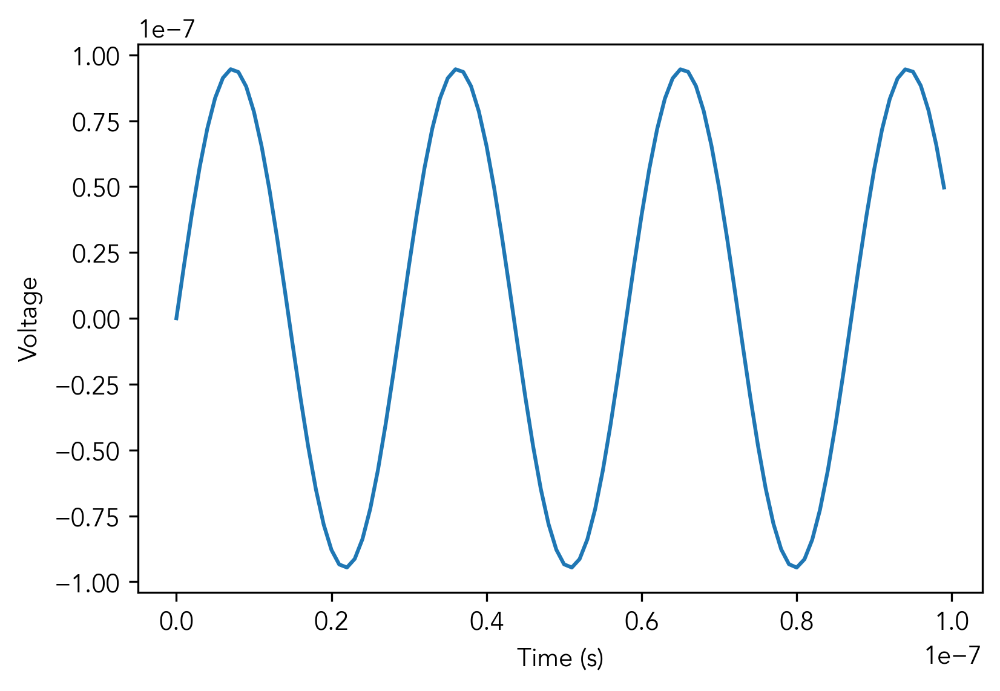

In [18]:
def getMixedSignal(f,tArray,fLO,ALO):
    theSignal=0.5*ALO*math.sqrt(P*50)*np.sin((f-fLO)*tArray/(2*math.pi))   #50 from R=50ohm, probably a factor of 2 wrong
    return theSignal

fig,ax = plt.subplots()
P=getPower(1,getBetaFromT(T_end),math.pi/2)
print("Power",P)
tArray=np.linspace(0,T_acq,numSamps)
theSignal=getMixedSignal(getCyclotronFreqTime(1,T_end,tArray),tArray,25.65e9,10)
ax.plot(tArray[0:100],theSignal[0:100])
ax.set_xlabel("Time (s)")
ax.set_ylabel("Voltage")

1.00000010000001e-11 99999990000.0


Text(0, 0.5, 'Voltage')

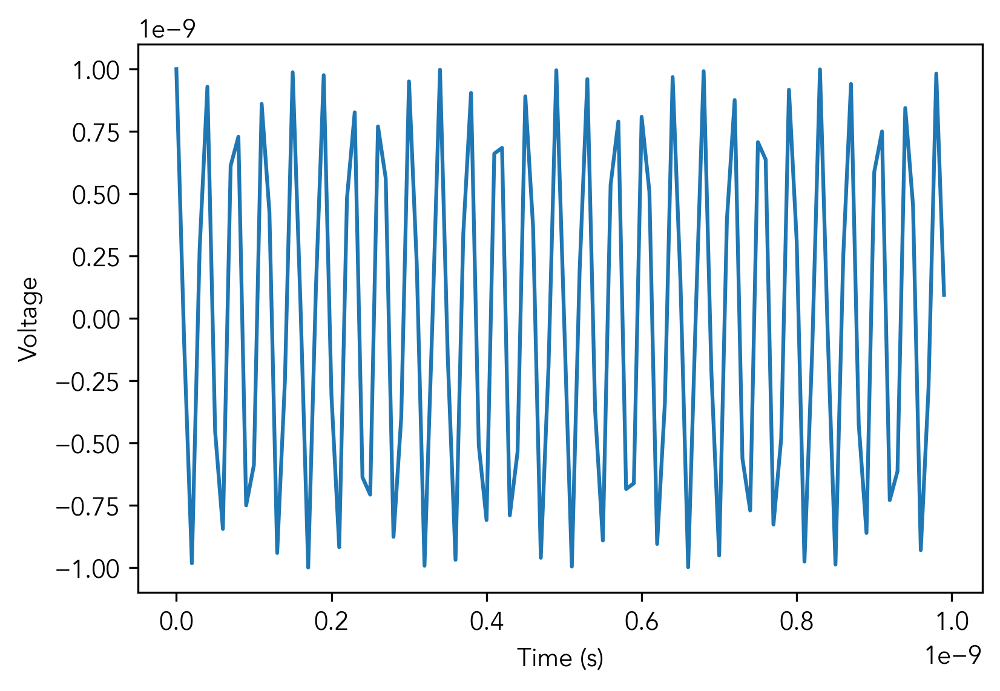

In [93]:
fineTArray=np.linspace(0,1e-4,10000000)
dtFine=fineTArray[1]-fineTArray[0]
fsFine=1/dtFine
print(dtFine,fsFine)

ALO=1e-9
fLO=26.5e9
loSignal=ALO*np.cos(fLO*fineTArray*(2*math.pi))
fig,ax = plt.subplots()
ax.plot(fineTArray[0:100],loSignal[0:100])
ax.set_xlabel("Time (s)")
ax.set_ylabel("Voltage")


Power 7.175739074589474e-18


Text(0, 0.5, 'Voltage')

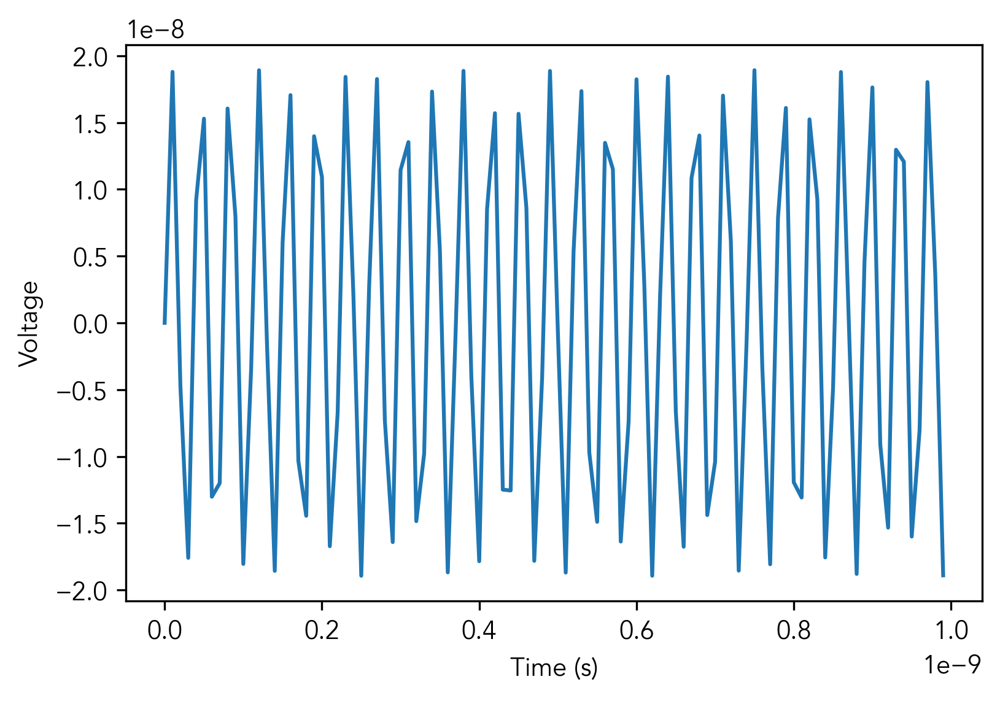

In [94]:
P=getPower(1,getBetaFromT(T_end),math.pi/2)
print("Power",P)
ft=fineTArray*getCyclotronFreqTime(1,T_end,fineTArray)
theSignal=math.sqrt(P*50)*np.sin(ft*(2*math.pi))
fig,ax = plt.subplots()
ax.plot(fineTArray[0:100],theSignal[0:100])
ax.set_xlabel("Time (s)")
ax.set_ylabel("Voltage")

Text(0, 0.5, 'Voltage')

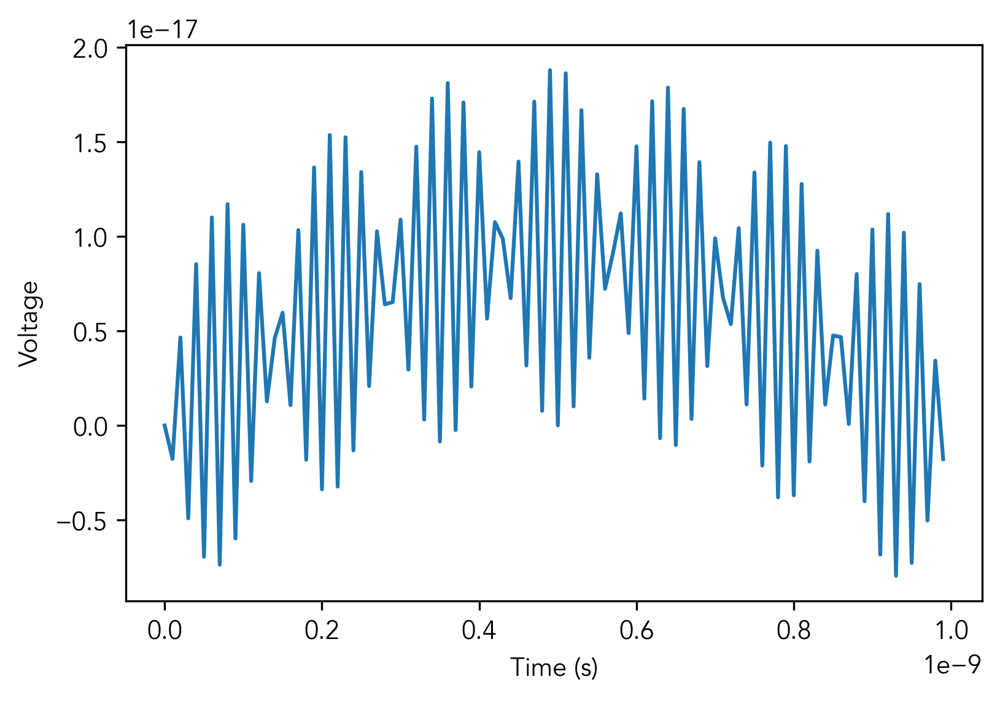

In [95]:
mixedSignal=loSignal*theSignal
fig,ax = plt.subplots()
ax.plot(fineTArray[0:100],mixedSignal[0:100])
ax.set_xlabel("Time (s)")
ax.set_ylabel("Voltage")

Noise sigma= 1.1750102127215746e-06  volts
9.0 9.0


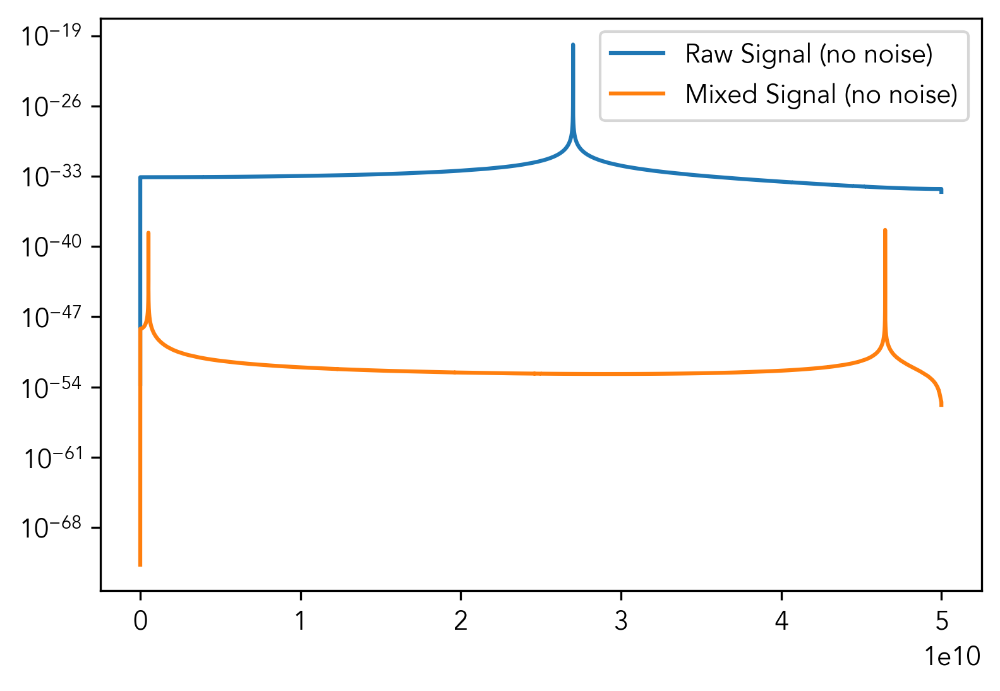

In [96]:
from scipy import signal

sigma=getNoiseSigma(4,50,500e6)  #4K, 50Ohm and 500MHz
print("Noise sigma=",sigma," volts")


fig,ax = plt.subplots()
print(np.log10(fs),np.log10(1e9))
f, Pxx_den = signal.periodogram(theSignal, fsFine)
ax.semilogy(f, Pxx_den,label="Raw Signal (no noise)")
f, Pxx_den = signal.periodogram(mixedSignal, fsFine)
ax.semilogy(f, Pxx_den,label="Mixed Signal (no noise)")
ax.legend()

In [97]:
print((fLO-250e6)/10000,(fLO+250e6)/10000)


2625000.0 2675000.0


In [128]:
print(f[2640000],f[2790000])
N=2790000-2640000
print(N)
fNoise=np.zeros(len(f),dtype=np.cdouble)

26399997360.0 27899997210.0
150000


In [129]:

sigma=getNoiseSigma(4,50,1500e6)  #4K, 50Ohm and 1500MHz
noiseScale=sigma*np.sqrt(N/2)
fNoise[2640000:2790000]=np.random.normal(scale=noiseScale,size=N) + 1j*np.random.normal(scale=noiseScale,size=N)
justNoise=irfft(fNoise)
print(justNoise)

[ 1.66354812e-08 -7.53919012e-08  2.66584646e-09 ... -6.11237259e-08
 -3.42866019e-08  7.05716340e-08]


9.0 9.0


Text(0, 0.5, 'PSD (V^2/Hz * scale)')

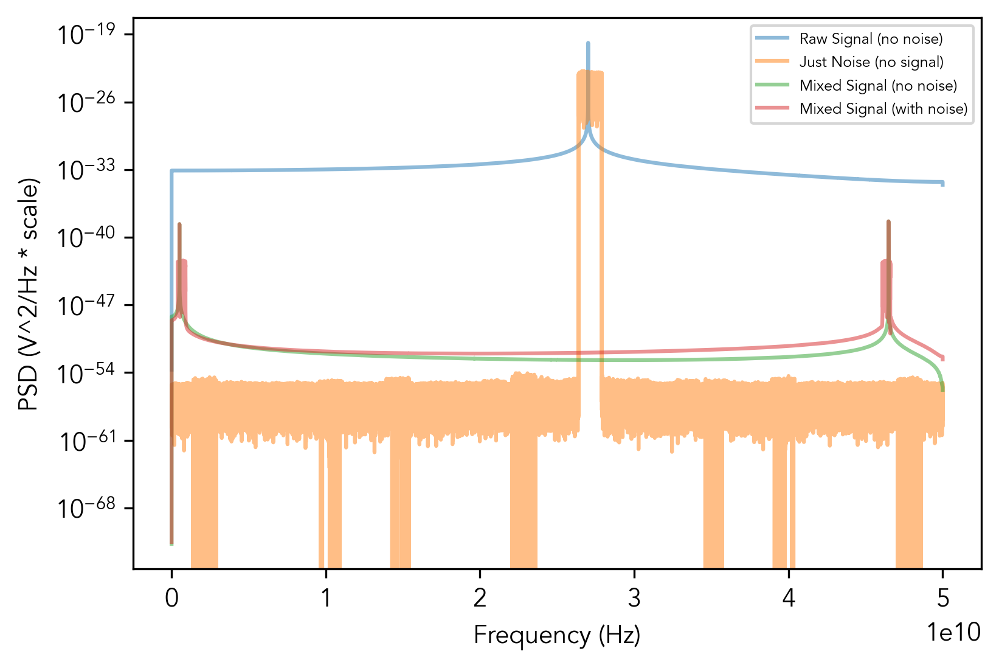

In [130]:

fig,ax = plt.subplots(facecolor='w')
print(np.log10(fs),np.log10(1e9))
f, Pxx_den = signal.periodogram(theSignal, fsFine)
ax.semilogy(f, Pxx_den,label="Raw Signal (no noise)",alpha=0.5)
f, Pxx_den = signal.periodogram(justNoise, fsFine)
ax.semilogy(f, Pxx_den,label="Just Noise (no signal)",alpha=0.5)
f, Pxx_den = signal.periodogram(mixedSignal, fsFine)
ax.semilogy(f, Pxx_den,label="Mixed Signal (no noise)",alpha=0.5)
f, Pxx_den = signal.periodogram(sigPlusNoise, fsFine)
ax.semilogy(f, Pxx_den,label="Mixed Signal (with noise)",alpha=0.5)
ax.legend(loc='upper right',prop={'size': 6})
ax.set_xlabel("Frequency (Hz)")
ax.set_ylabel("PSD (V^2/Hz * scale)")

Text(0, 0.5, 'Voltage')

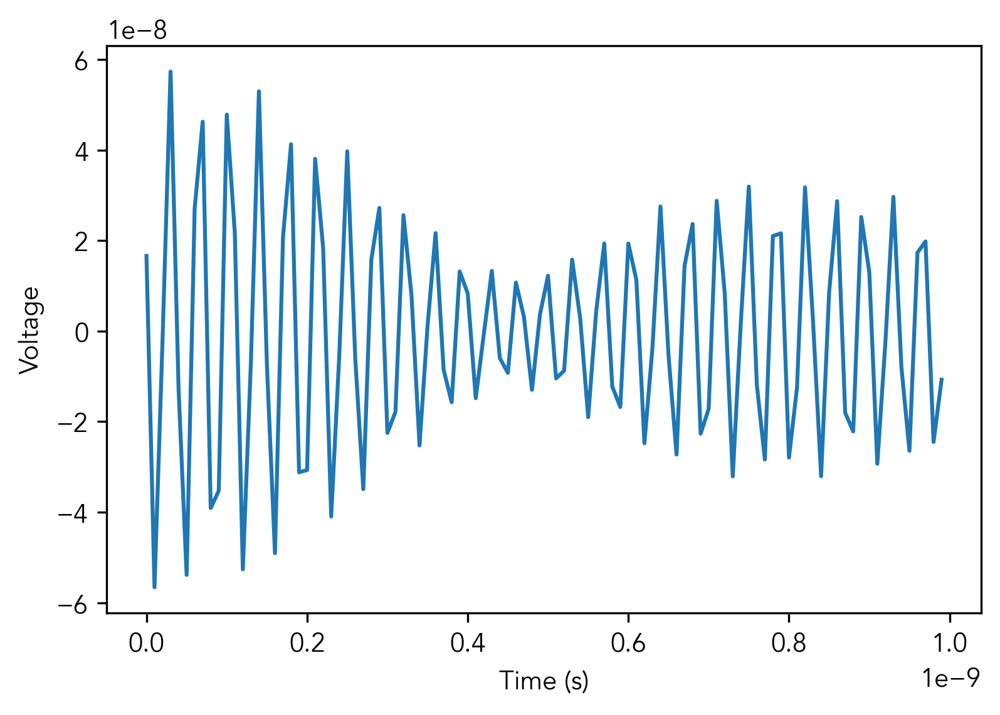

In [131]:

fig,ax = plt.subplots()
ax.plot(fineTArray[0:100],(theSignal+justNoise)[0:100])
ax.set_xlabel("Time (s)")
ax.set_ylabel("Voltage")

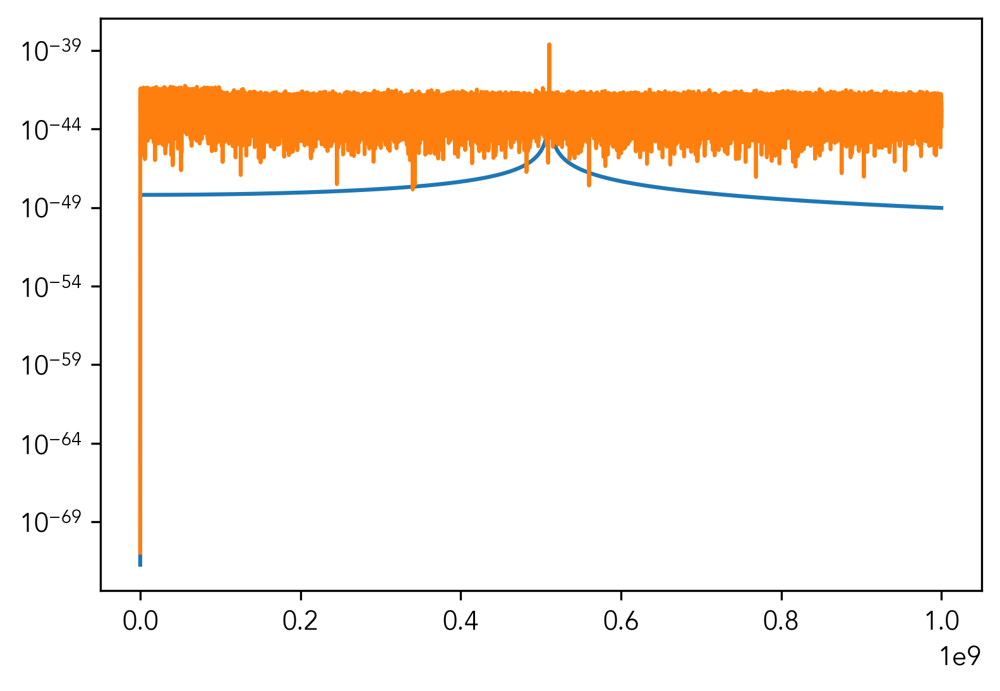

In [132]:
sigPlusNoise=(theSignal+justNoise)*loSignal
fig,ax = plt.subplots()
numFreqBins=100000
f, Pxx_den = signal.periodogram(mixedSignal, fsFine)
ax.semilogy(f[0:numFreqBins], Pxx_den[0:numFreqBins],label="Mixed Signal (no noise)")
f, Pxx_den = signal.periodogram(sigPlusNoise, fsFine)
ax.semilogy(f[0:numFreqBins], Pxx_den[0:numFreqBins],label="Mixed Signal (with noise)")

Text(0, 0.5, 'Voltage')

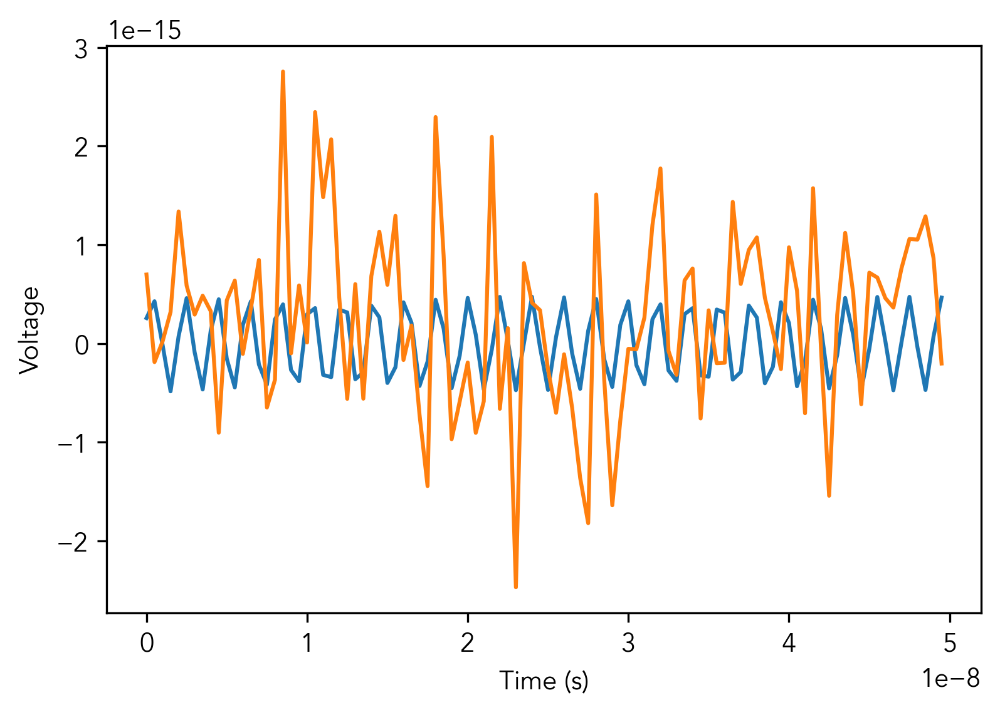

In [133]:
mixedSignalFreq=rfft(mixedSignal)
mixedSignalDown=irfft(mixedSignalFreq[0:100001])
mixedSigNoiseFreq=rfft(sigPlusNoise)
mixedSigNoiseDown=irfft(mixedSigNoiseFreq[0:100001])

coarseTArray=np.linspace(0,1e-4,len(mixedSignalDown))
fig,ax = plt.subplots()
ax.plot(coarseTArray[0:100],mixedSignalDown[0:100],label="Just signal")
ax.plot(coarseTArray[0:100],mixedSigNoiseDown[0:100],label="Signal+Noise")
ax.set_xlabel("Time (s)")
ax.set_ylabel("Voltage")
